In [2]:
!pip install venn

  Created wheel for venn: filename=venn-0.1.3-py3-none-any.whl size=19699 sha256=08ea6549bf2cc8351eeb4a13c780037f26787cc8e8310134f9d55eab0f5fea02
  Stored in directory: /root/.cache/pip/wheels/24/25/51/e88b9ad98643aa2c27f01a9bf5ccd10b7239e7535135d3feb1
Successfully built venn


In [23]:
import numpy as np
import pandas as pd
from IPython.core.interactiveshell import InteractiveShell
from PIL import Image
import os

InteractiveShell.ast_node_interactivity = "all"
import warnings

warnings.filterwarnings("ignore")
# warnings.filterwarnings(action='once')

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

%matplotlib inline
# plots
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import tensorflow as tf
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    plot_confusion_matrix,
    precision_recall_curve,
    precision_score,
    recall_score,
    roc_auc_score,
    roc_curve,
)
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from tensorflow import keras
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.layers import (
    AveragePooling2D,
    AvgPool2D,
    Conv2D,
    Dense,
    Flatten,
    GlobalAveragePooling2D,
    MaxPooling2D,
)
from tensorflow.keras.models import Sequential

# keras
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import notebook, tqdm
from venn import venn

In [56]:
PATH = "/app/_data/"
BATCH_SIZE = 64
SEED = 42

In [57]:
labels = pd.read_csv(PATH + "train.csv")

In [58]:
labels.head()
labels.info()

,image,labels
0,800113bb65efe69e.jpg,healthy
1,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex
2,80070f7fb5e2ccaa.jpg,scab
3,80077517781fb94f.jpg,scab
4,800cbf0ff87721f8.jpg,complex


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18632 entries, 0 to 18631
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   18632 non-null  object
 1   labels  18632 non-null  object
dtypes: object(2)
memory usage: 291.2+ KB


In [59]:
labels.image.duplicated().sum()

0

In [60]:
labels["labels"].value_counts(normalize=True)

scab                               0.259017
healthy                            0.248175
frog_eye_leaf_spot                 0.170728
cider_apple_rust                   0.099828
complex                            0.085981
powdery_mildew                     0.063547
scab frog_eye_leaf_spot            0.036818
scab frog_eye_leaf_spot complex    0.010734
frog_eye_leaf_spot complex         0.008856
rust frog_eye_leaf_spot            0.006441
rust complex                       0.005206
powdery_mildew complex             0.004669
Name: labels, dtype: float64

In [62]:
count_vec = CountVectorizer(binary=True)
labels = labels.join(
    pd.DataFrame(
        count_vec.fit_transform(labels["labels"]).toarray(),
        columns=count_vec.get_feature_names(),
    )
)

In [63]:
labels.index = labels["image"].str.slice(0, -4)

In [64]:
labels.head()

,image,labels,cider_apple_rust,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab
image,,,,,,,,,
800113bb65efe69e,800113bb65efe69e.jpg,healthy,0,0,0,1,0,0,0
8002cb321f8bfcdf,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex,0,1,1,0,0,0,1
80070f7fb5e2ccaa,80070f7fb5e2ccaa.jpg,scab,0,0,0,0,0,0,1
80077517781fb94f,80077517781fb94f.jpg,scab,0,0,0,0,0,0,1
800cbf0ff87721f8,800cbf0ff87721f8.jpg,complex,0,1,0,0,0,0,0


In [65]:
labels_dict = {}
for ind in labels.index:
    labels_dict[ind] = labels.loc[ind, labels.columns[2:]].astype("float16").values

In [ ]:
# df = pd.read_csv(PATH + "train.csv", index_col=0)
# def list_indexes(list, cols=None):
#     """
#     Creates a dictionary mapping values to indexes
#     """
#     if cols is None:
#         cols = list
#     return dict([(x, list.index(x)) for x in cols])

# # label indexes in 1-hot representation
# label_ixs = sorted(list(set(" ".join(set(df.labels)).split(" "))))
# label_ixs = list_indexes(label_ixs)

# labels_my = {}
# # id: 1h
# for k, v in df.to_dict()["labels"].items():
#     y = np.zeros((len(label_ixs)), dtype=np.float16)
#     y[list(map(lambda x: label_ixs[x], v.split(" ")))] = 1.0
#     labels_my[k[:-4]] = y

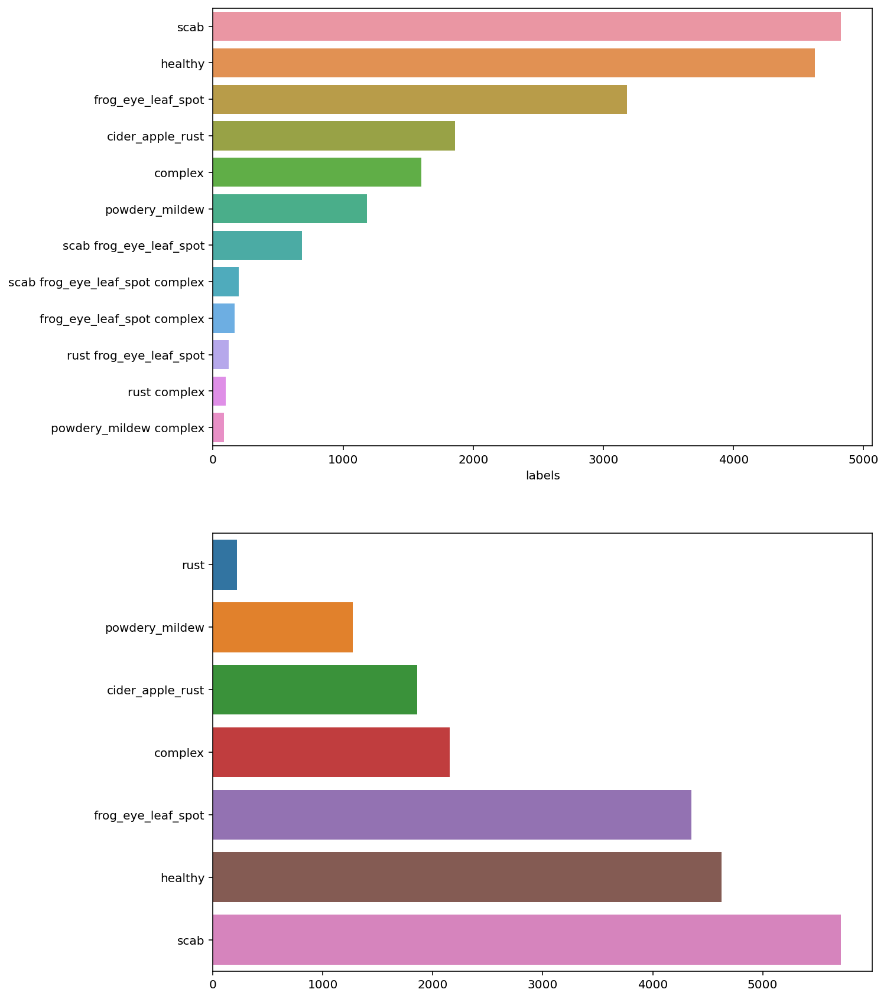

In [10]:
plt.figure(figsize=(10, 15))
plt.title("Distribution of target classes")
plt.subplot(2, 1, 1)
sns.barplot(
    y=labels["labels"].value_counts().index,
    x=labels["labels"].value_counts(),
    orient="h",
)
plt.subplot(2, 1, 2)
sns.barplot(
    x=labels.iloc[:, 2:].sum().sort_values(),
    y=labels.iloc[:, 2:].sum().sort_values().index,
)
plt.show();

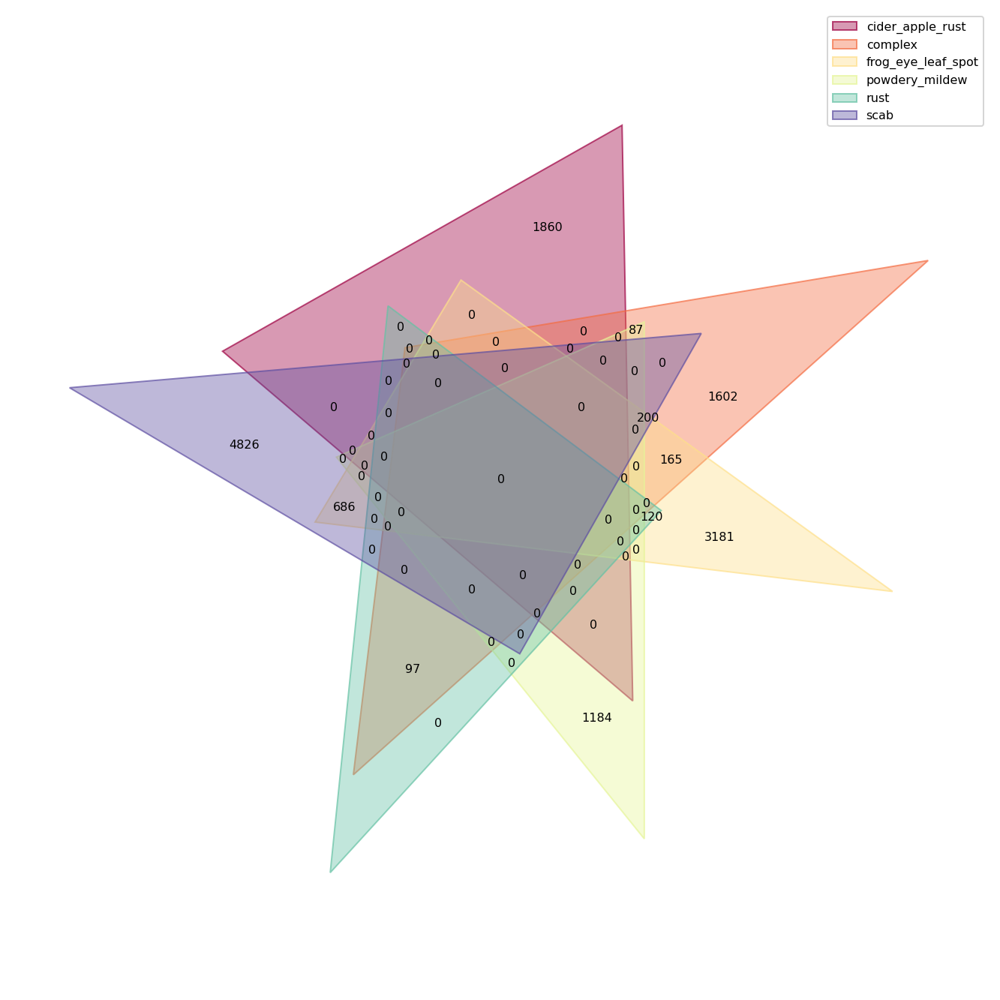

In [11]:
# venn diagram for comment type intersections

classes = [
    "cider_apple_rust",
    "complex",
    "frog_eye_leaf_spot",
    "powdery_mildew",
    "rust",
    "scab",
]
venn_dict = {}

for c in classes:
    venn_dict[c] = set(labels.loc[labels[c] == 1].index.to_numpy())

venn(venn_dict, cmap="Spectral", fontsize=8, figsize=(12, 12));

In [12]:
def show_image(disease, num_image=4):
    plt.figure(figsize=(15, 3 * np.ceil(num_image / 4)))
    data = labels.query("labels == @disease").sample(num_image)
    for j, image_name in enumerate(data["image"]):
        image = mpimg.imread("/app/_data/train_images/" + image_name)
        plt.subplot(np.ceil(num_image / 4), 4, j + 1)
        plt.title(disease)
        plt.imshow(image, aspect="auto")
        plt.xticks([])
        plt.yticks([])
    #     plt.tight_layout()
    plt.show();

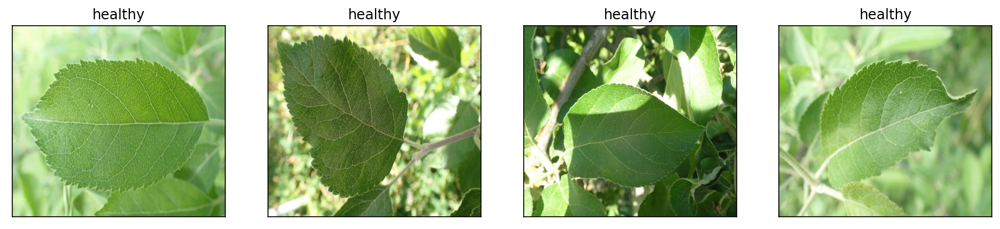

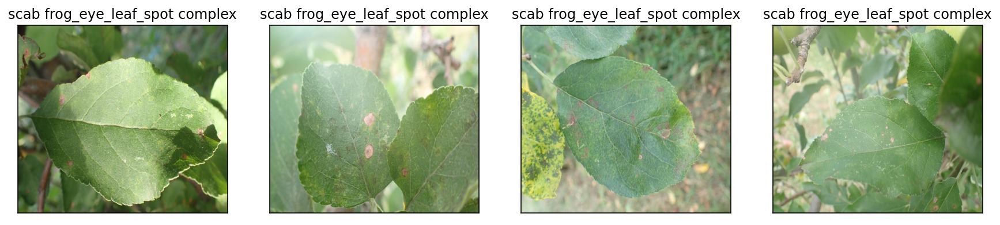

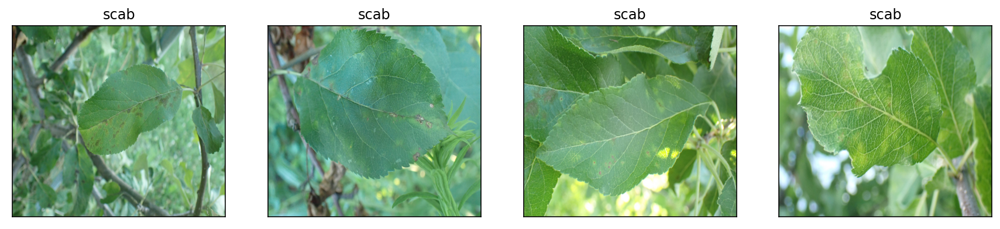

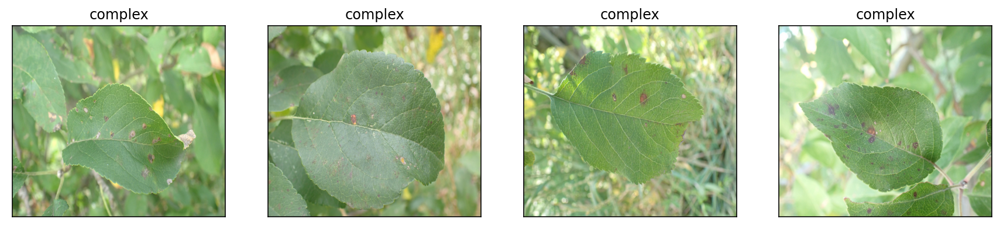

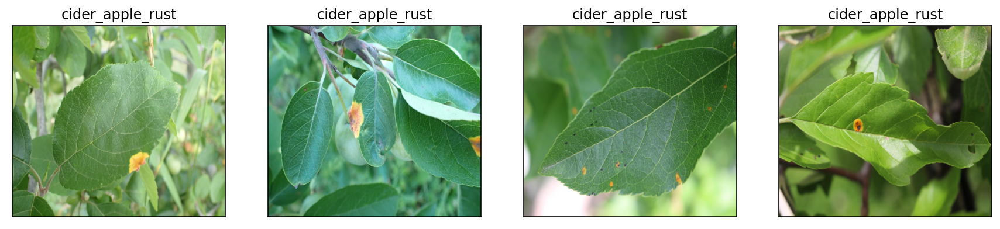

...

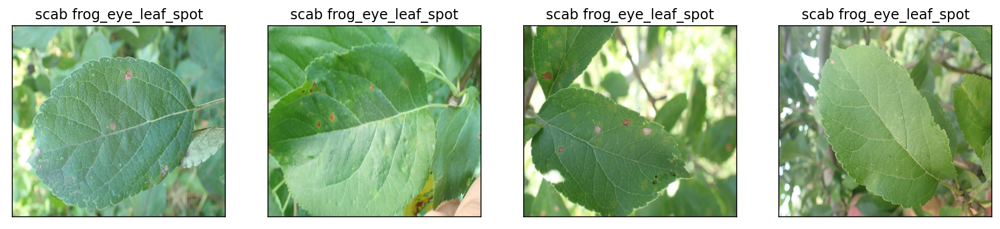

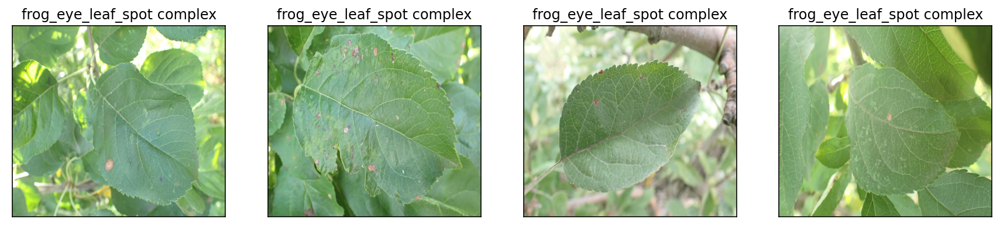

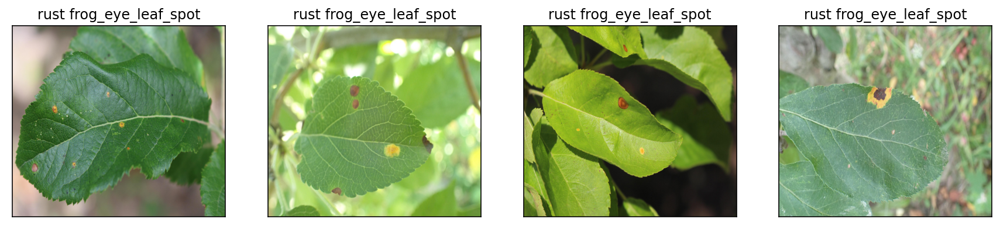

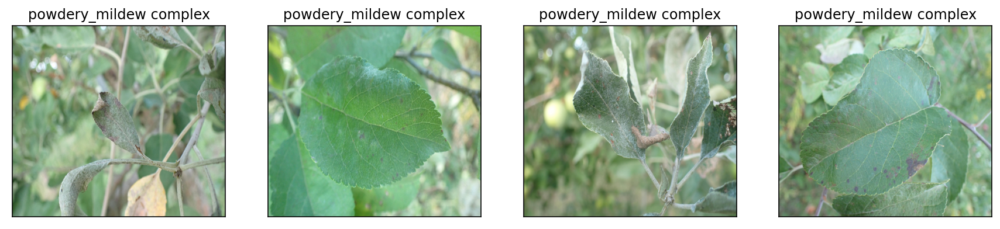

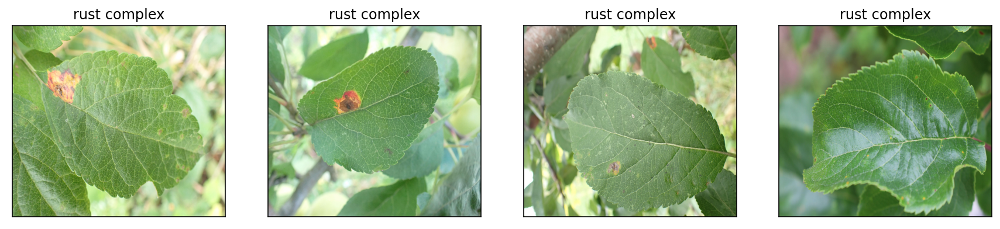

In [13]:
for disease in labels["labels"].unique():
    show_image(disease, 4)

In [14]:
# example of loading an image with the Keras API
from tensorflow.keras.preprocessing.image import load_img

# load the image
img = load_img("/app/_data/train_images/8002cb321f8bfcdf.jpg")
# report details about the image
print(type(img))
print(img.format)
print(img.mode)
print(img.size)
img.show()

<class 'PIL.JpegImagePlugin.JpegImageFile'>
JPEG
RGB
(4000, 2672)


In [127]:
# convert to numpy array
img_array = tf.keras.preprocessing.image.img_to_array(img)
print(img_array.dtype)
print(img_array.shape)
# convert back to image
img_pil = tf.keras.preprocessing.image.array_to_img(img_array)
print(type(img_pil))

float32
(2672, 4000, 3)
<class 'PIL.Image.Image'>


In [136]:
img_path = "/app/_data/train_images/"
for image_ind in range(5):
    img_name = labels.loc[image_ind, "image"]
    img = load_img(img_path + img_name)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    #     labels.loc[image_ind, 'im_array'] = img_array
    print(img_array.shape)

(2672, 4000, 3)
(2672, 4000, 3)
(2672, 4000, 3)
(2672, 4000, 3)
(2672, 4000, 3)


In [15]:
l5 = labels.head()
l5

,image,labels,cider_apple_rust,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab
0,800113bb65efe69e.jpg,healthy,0,0,0,1,0,0,0
1,8002cb321f8bfcdf.jpg,scab frog_eye_leaf_spot complex,0,1,1,0,0,0,1
2,80070f7fb5e2ccaa.jpg,scab,0,0,0,0,0,0,1
3,80077517781fb94f.jpg,scab,0,0,0,0,0,0,1
4,800cbf0ff87721f8.jpg,complex,0,1,0,0,0,0,0


In [16]:
img_path = "/app/_data/train_images/"
aa = []
for image_ind in range(5):
    img_name = l5.loc[image_ind, "image"]
    img = load_img(img_path + img_name)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    aa.append(img_array)
#     print(aa.shape)

In [11]:
train_datagen = ImageDataGenerator(rescale=1.0 / 255, validation_split=0.25)
train = train_datagen.flow_from_dataframe(
    dataframe=labels,
    directory=PATH + "train_images/",
    x_col="image",
    y_col="labels",
    target_size=(224, 224),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="training",
    seed=SEED,
)

Found 13974 validated image filenames belonging to 12 classes.


In [12]:
valid_datagen = ImageDataGenerator(rescale=1.0 / 255, validation_split=0.25)
valid = valid_datagen.flow_from_dataframe(
    dataframe=labels,
    directory=PATH + "train_images/",
    x_col="image",
    y_col="labels",
    target_size=(224, 224),
    batch_size=BATCH_SIZE,
    class_mode="categorical",
    subset="validation",
    seed=SEED,
)

Found 4658 validated image filenames belonging to 12 classes.


In [13]:
# features, target = next(train)
# plt.figure(figsize=(10, 10))
# for i in range(1, 17):
#     image = features[i - 1]
#     label = target[i - 1]
#     plt.subplot(4, 4, i)
#     plt.imshow(image)
#     plt.xlabel(label)
#     plt.xticks([])
#     plt.yticks([])
#     plt.tight_layout()
# plt.show();

In [14]:
# def f1(y_true, y_pred):
#     precision = keras.metrics.Precision(y_true, y_pred)
#     recall = keras.metrics.Recall(y_true, y_pred)
#     return 2 * ((precision * recall) / (precision + recall))

In [15]:
tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU'),
 PhysicalDevice(name='/physical_device:GPU:2', device_type='GPU')]

In [16]:
backbone = ResNet50(input_shape=(224, 224, 3), weights="imagenet", include_top=False)
model_raw = Sequential()
model_raw.add(backbone)
model_raw.add(GlobalAveragePooling2D())
model_raw.add(Dense(units=12, activation="softmax"))
model_raw.compile(
    loss="CategoricalCrossentropy",
    optimizer=Adam(lr=0.001),
    metrics=["acc", keras.metrics.Recall(), keras.metrics.Precision()],
)

94773248/94765736 [==============================] - 7s 0us/step


In [42]:
labels.sample()

,image,labels,cider_apple_rust,complex,frog_eye_leaf_spot,healthy,powdery_mildew,rust,scab
image,,,,,,,,,
ffe030c2564a5557,ffe030c2564a5557.jpg,healthy,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
np.zeros(
    (32, 224, 224, 3),
    dtype=np.float16,
)[1].shape

(224, 224, 3)

In [28]:
ids = 'd595813ad012f1f7'
src_file = os.path.join(PATH, 'train_images', ids+'.jpg')

sample_id = re.findall("/(\\w+)\\.jpg", src_file)

In [25]:
import re

In [34]:
# cache_file = 
(
            f"{'/app/_data/cache'}/{ids}_"+ f"{224}x"
            + f"{224}.npy"
        )[:-4]


'/app/_data/cache/d595813ad012f1f7_224x224'

In [35]:
x = Image.open(src_file)
x = x.resize((224,224), resample=Image.BICUBIC)
x = np.array(x)
x.shape

# # save to cache
# if write_cache and self.cache_dir is not None:
#     np.save(cache_file[:-4], x)

(224, 224, 3)

In [67]:
labels_dict[ids]

array([0., 0., 0., 1., 0., 0., 0.], dtype=float16)

In [38]:
sample_id

['d595813ad012f1f7']

In [66]:
labels_dict['d595813ad012f1f7']

array([0., 0., 0., 1., 0., 0., 0.], dtype=float16)

In [78]:
np.mean(x, axis=(1, 0))
np.mean(x, axis=(0,1,2))

array([128.89781967, 170.86061065, 101.63883131])

133.7990872130102

In [79]:
x = x.astype(np.float32)
x = x - np.mean(x, axis=(0, 1))
x = x / np.std(x, axis=(0, 1))

# return x.astype(np.float16), y

In [1]:
from . import backend as K


ImportError: attempted relative import with no known parent package

In [2]:
def f1(y_true, y_pred): #taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [ ]:
def precision(y_true, y_pred):
    """Precision metric.
    Only computes a batch-wise average of precision.
    Computes the precision, a metric for multi-label classification of
    how many selected items are relevant.
    """
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

In [ ]:
def fbeta_score(y_true, y_pred, beta=1):
    """Computes the F score.
    The F score is the weighted harmonic mean of precision and recall.
    Here it is only computed as a batch-wise average, not globally.
    This is useful for multi-label classification, where input samples can be
    classified as sets of labels. By only using accuracy (precision) a model
    would achieve a perfect score by simply assigning every class to every
    input. In order to avoid this, a metric should penalize incorrect class
    assignments as well (recall). The F-beta score (ranged from 0.0 to 1.0)
    computes this, as a weighted mean of the proportion of correct class
    assignments vs. the proportion of incorrect class assignments.
    With beta = 1, this is equivalent to a F-measure. With beta < 1, assigning
    correct classes becomes more important, and with beta > 1 the metric is
    instead weighted towards penalizing incorrect class assignments.
    """
    if beta < 0:
        raise ValueError('The lowest choosable beta is zero (only precision).')

    # If there are no true positives, fix the F score at 0 like sklearn.
    if K.sum(K.round(K.clip(y_true, 0, 1))) == 0:
        return 0

    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    bb = beta ** 2
    fbeta_score = (1 + bb) * (p * r) / (bb * p + r + K.epsilon())
    return fbeta_score

In [ ]:
def precision(y_true, y_pred):
    """Precision metric.
    Only computes a batch-wise average of precision.
    Computes the precision, a metric for multi-label classification of
    how many selected items are relevant.
    """
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision


def recall(y_true, y_pred):
    """Recall metric.
    Only computes a batch-wise average of recall.
    Computes the recall, a metric for multi-label classification of
    how many relevant items are selected.
    """
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall